# LAB2, Part1

## Question 5

In [111]:
%matplotlib inline

#for number operations
import numpy as np 

#for graphing
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

In [112]:
#Sensor (stays constant)
def sense(x): #simulate sensor
    return x

In [113]:
def simulate(Δt, x, u): #dynamics

    x += Δt * u
    return x

In [114]:
def control(t, y,k=1.0): #control policy
    pd=np.array([3.,3.])
    u=k*(pd-y)
    #u(t) = K(pd − p(t))
    
    return u

In [115]:
#Getting point robot path
tf = 15
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([1., 2.])
x_log = [np.copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)
    x = simulate(Δt, x, u)

    x_log.append(np.copy(x))
    
x_log = np.array(x_log)

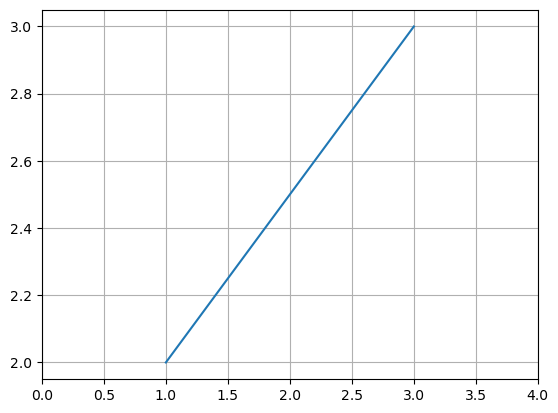

In [116]:
#Graphing
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])
plt.xlim(0,4)
num_arrows = 5
arrow_indices = np.linspace(0, len(x_log) - 2, num_arrows, dtype=int)


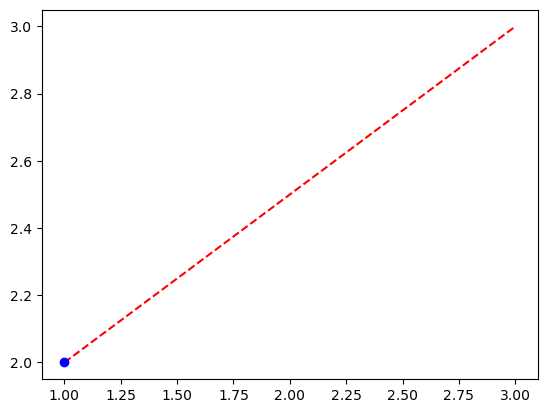

In [117]:

fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())

## Question 6

In [118]:
def control(t, y):
    ### WRITE YOUR CONTROL POLICY HERE:
    
    if t <= 3.8:  # origin to 3,3
        pd = array([t, t])
    elif t <= 7.0:  # (3,3) --> (3,-3)
        pd = array([3.0, -3.0])
    elif t <= 10.0:  # (3,-3) --> (-3,3)
        pd = array([-3.0, 3.0])
    else:  # (-3,3) --> (-3,-3)
        pd = array([-3.0, -3.0])

    K = 1.0
    
    # Position Controller
    u = K * (pd - y)
    
    return u

In [119]:
#Getting point robot path
tf = 15
Δt = 0.1    # Time step
time = np.linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([0., 0.])
x_log = [np.copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)
    x = simulate(Δt, x, u)
    x_log.append(np.copy(x))
    
x_log = np.array(x_log)

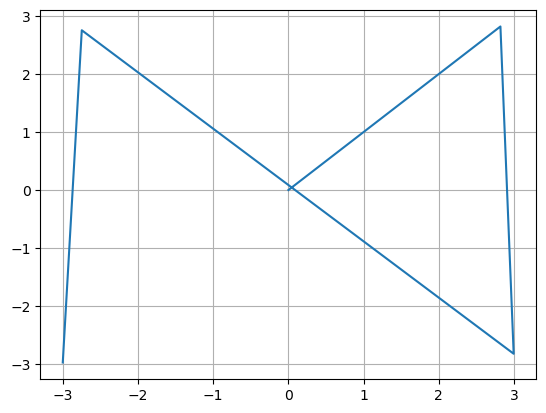

In [120]:
#Graphing
plt.grid()
plt.plot(x_log[:,0], x_log[:,1])


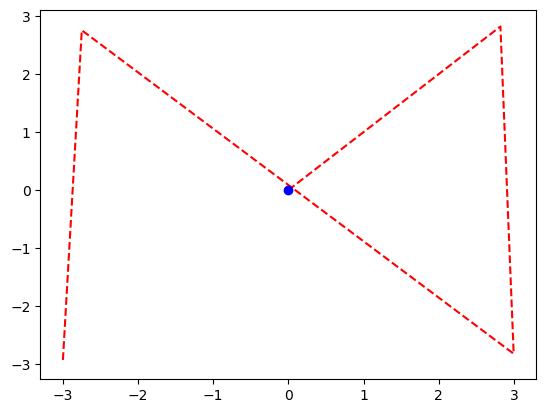

In [121]:

fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plt.plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plt.plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())

# LAB2, Part2

In [122]:
%pylab inline

#for number operations
import numpy as np 

#for graphing
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/Users/joykim/anaconda3/lib/python3.11/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['time']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [123]:
# Perfect sensor
def sense(x):
    return x

## **Problem 1**


In [124]:
def simulate(Δt, x, u, m=1, g=9.8):
    # Control input affects the acceleration
    dx = array([x[3], x[4], x[5], u[0]/m, u[1]/m, u[2]/m])
    
    # Include the gravity in the acceleration in z
    dx[5] += - g
        
    # Euler integration
    x += Δt * dx
    
    # Simulate the floor (Plastic collision)    
    if x[2] < 0:        
        x[2] = 0  # z = 0
        x[5] = 0  # vz = 0
    
    return x

In [125]:
def control(t, y):    
    ux = 0
    uy = 0
    #FREEFALL
    uz= 0
    
    #if the control function sets ux, uy, and uz to zero, the object will still be under the 
    #influence of gravity due to the line dx[5] += -g in the simulate function. This means the 
    #object will experience freefall in the z-direction because gravity is explicitly included 
    #in the simulation. 
    

    return [ux, uy, uz]

In [126]:
tf = 3.
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = np.array([0., 0., 10., 0.,0.,0.])
x_log = [copy(x)]


for t in time:    
    y = sense(x)
    u = control(t, y)
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

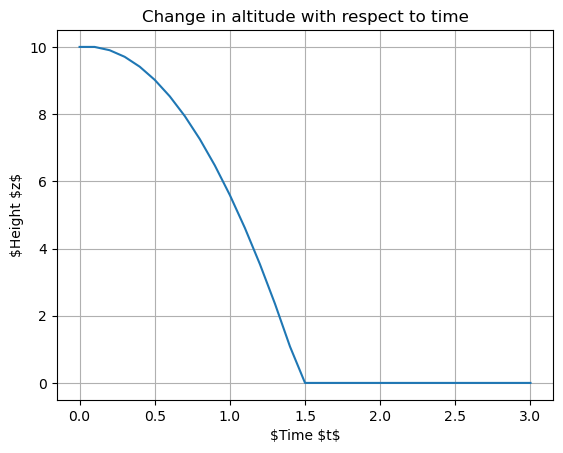

In [127]:
fig, ax = plt.subplots()
ax.plot(time, x_log[:-1,2])
ax.set(title="Change in altitude with respect to time", xlabel="$Time $t$", ylabel="$Height $z$")
ax.grid()


# axes().set_ylabel("Time z")

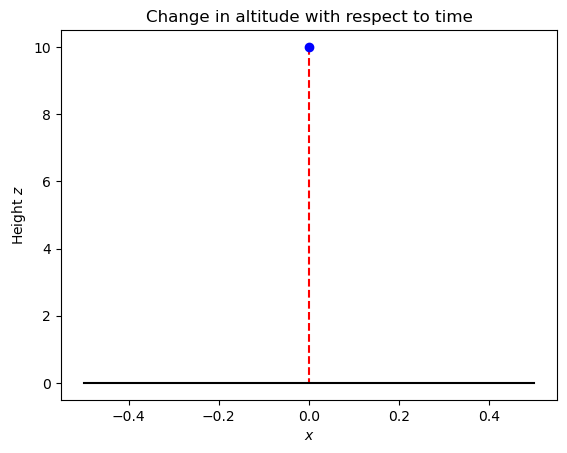

In [128]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(x_log[:,0], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot(x_log[t,0], x_log[t,2], 'bo')
    
    # Plot floor
    ax.plot([-0.5,0.5], [0,0], 'k-')
    
    ax.set(title="Change in altitude with respect to time", xlabel="$x$", ylabel="Height $z$")

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())




## **Problem 2**

In [129]:
#Include a buoyancy force of fb=9.0 in the simulator. 
#How does it compare with the free fall? Which one falls faster?  (Exercise 1 of Chapter 3).
# SOLUTION: The free fall falls faster!

def simulate(Δt, x, u, m=1, g=9.8):
    # Control input affects the acceleration
    dx = array([x[3], x[4], x[5], u[0]/m, u[1]/m, u[2]/m])
    
    # Include the gravity in the acceleration in z
    dx[5] += - g + (9.0/m) #buoyancy force HERE
        
    # Euler integration
    x += Δt * dx
    
    # Simulate the floor (Plastic collision)    
    if x[2] < 0:        
        x[2] = 0  # z = 0
        x[5] = 0  # vz = 0
    
    return x

In [130]:
tf = 6.
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = array([0., 0., 10., 0.,0.,0.])
x_log = [copy(x)]


for t in time:    
    y = sense(x)
    u = control(t, y)
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

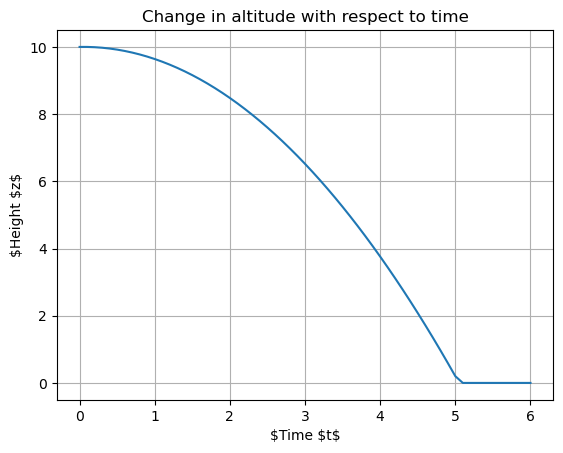

In [131]:
fig, ax = plt.subplots()
ax.plot(time, x_log[:-1,2])
ax.set(title="Change in altitude with respect to time", xlabel="$Time $t$", ylabel="$Height $z$")
ax.grid()


# axes().set_ylabel("Time z")

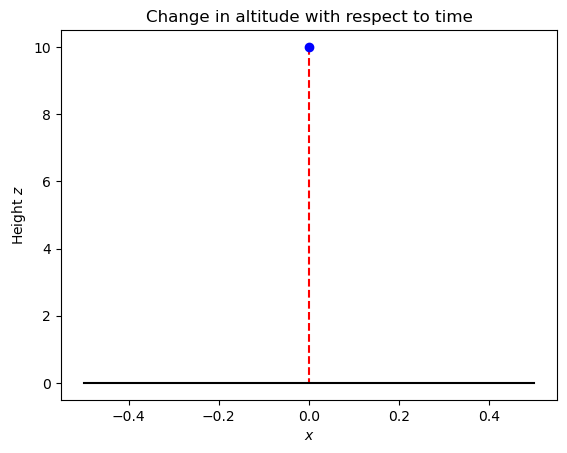

In [132]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(x_log[:,0], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot(x_log[t,0], x_log[t,2], 'bo')
    
    # Plot floor
    ax.plot([-0.5,0.5], [0,0], 'k-')
    
    ax.set(title="Change in altitude with respect to time", xlabel="$x$", ylabel="Height $z$")

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)
#changed frames to 6

HTML(anim.to_jshtml())

## **Problem 3**

In [133]:
def simulate(Δt, x, u, m=1, g=9.8):
    # Control input affects the acceleration
    dx = array([x[3], x[4], x[5], u[0]/m, u[1]/m, u[2]/m])
    
    # Include the gravity in the acceleration in z
    dx[5] += - g
        
    # Euler integration
    x += Δt * dx
    
    # Simulate the floor (Plastic collision)    
    if x[2] < 0:        
        x[2] = 0  # z = 0
        x[5] = 0  # vz = 0
    
    return x

In [134]:
def control(t, y, x, m=1, g=9.8, k_d=3.5, k_p=3):  
    #k_d --> dampens
    #k_p generates force proportional to height
    ux = 0
    uy = 0

    z_d = 15
    z = x[2] #[0,0,10, ...]
    vz = x[5] # velocity
  
    error_z = (z_d-z)
    
    #PD Controller: u = kp(zd − z) + kd(˙zd − z) + mg
    #uz= (z_d - z) + (deriv of zd =0 - deriv_z)  - m*g
    uz = k_p*error_z - k_d*vz + m*g
    
    return [ux, uy, uz]

In [135]:
tf = 15.
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = array([0., 0., 10., 0.,0.,0.])
x_log = [copy(x)]


for t in time:    
    y = sense(x)
    u = control(t, y, x)
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

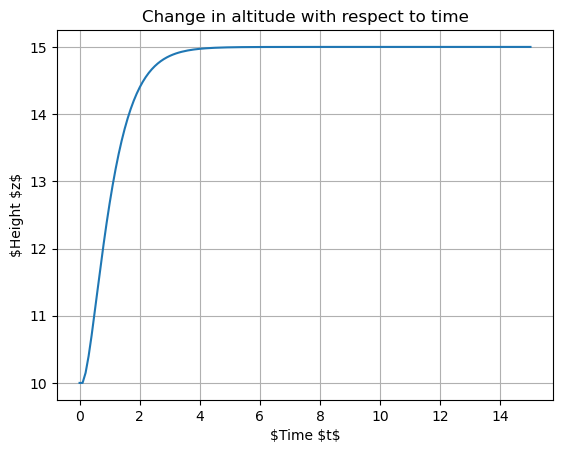

In [136]:
fig, ax = plt.subplots()
ax.plot(time, x_log[:-1,2])
ax.set(title="Change in altitude with respect to time", xlabel="$Time $t$", ylabel="$Height $z$")
ax.grid()


# axes().set_ylabel("Time z")

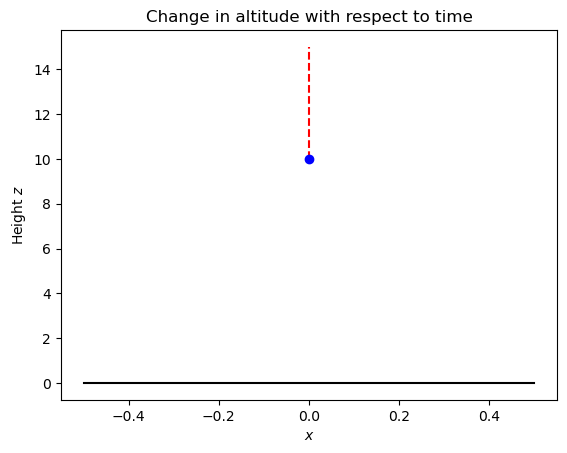

In [137]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(x_log[:,0], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot(x_log[t,0], x_log[t,2], 'bo')
    
    # Plot floor
    ax.plot([-0.5,0.5], [0,0], 'k-')
    
    ax.set(title="Change in altitude with respect to time", xlabel="$x$", ylabel="Height $z$")

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)


HTML(anim.to_jshtml())

## **Problem 4**

In [143]:
#Solve Excercise 3 of Chapter 3:  actual mass is m = 0.8 but m is 1
def simulate(Δt, x, u, m=0.8, g=9.8): #in the simulation the mass is 0.8
    # Control input affects the acceleration
    dx = array([x[3], x[4], x[5], u[0]/m, u[1]/m, u[2]/m])
    
    # Include the gravity in the acceleration in z
    dx[5] += - g
        
    # Euler integration
    x += Δt * dx
    
    # Simulate the floor (Plastic collision)    
    if x[2] < 0:        
        x[2] = 0  # z = 0
        x[5] = 0  # vz = 0
    
    return x

In [148]:
previous_error=0
accumulate_e=0
def control(t, y, x, m=1, g=9.8, ki=0.1, kd=3, kp=3): #controller considers m=1 even though 0.8  
    global previous_error, accumulate_e
    ux = 0
    uy = 0

    z_d = 15
    z = x[2] #[0,0,10, ...]
    vz = x[5] # velocity
    
    error_z = (z_d-z)
    accumulate_e += error_z
    deriv_e=(0 - vz)
    
    #PID Controller: 
    uz = kp*error_z + kd*deriv_e + ki*(accumulate_e) + m*g
    previous_error = error_z
    return [ux, uy, uz]

In [149]:
tf = 10.
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = array([0., 0., 10., 0.,0.,0.])
x_log = [copy(x)]

prevH=0
for t in time:    
    y = sense(x)
    u = control(t, y, x, prevH)
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

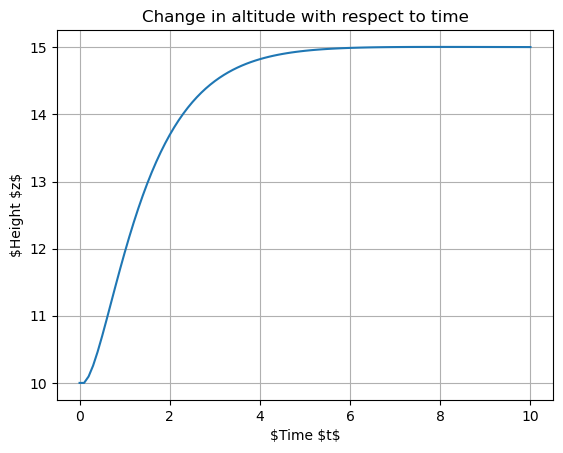

In [150]:
fig, ax = plt.subplots()
ax.plot(time, x_log[:-1,2])
ax.set(title="Change in altitude with respect to time", xlabel="$Time $t$", ylabel="$Height $z$")
ax.grid()


# axes().set_ylabel("Time z")

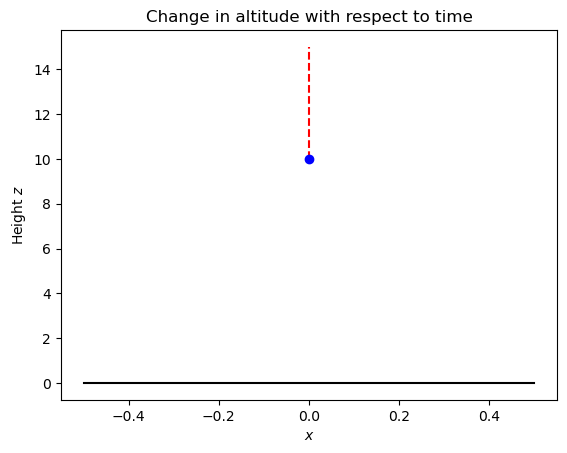

In [151]:
fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(x_log[:,0], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot(x_log[t,0], x_log[t,2], 'bo')
    
    # Plot floor
    ax.plot([-0.5,0.5], [0,0], 'k-')
    
    ax.set(title="Change in altitude with respect to time", xlabel="$x$", ylabel="Height $z$")

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)


HTML(anim.to_jshtml())